<a href="https://colab.research.google.com/github/Andrey-Mel/Detect_reindeers/blob/main/Hackaton_Rosneft_2021.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#Подключаю google.drive для работы с файлами изображений
from google.colab import drive
drive.mount('/content/drive')
from google.colab import files

print("Ok")


Mounted at /content/drive
Ok


In [2]:
#Загружаю YOLOv5, устанавливаю зависимости, проверяю подключение видеокарты
!git clone https://github.com/ultralytics/yolov5 #YOLO
%cd yolov5
!pip install -r requirements.txt #зависсимости


import torch
from IPython.display import Image, clear_output #display image
from utils.downloads import attempt_download # to download models/datasets
  


clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.10.0+cu111 CPU


In [3]:
#Подключаем модули
import os
import matplotlib.pyplot as plt
import shutil
import json
import numpy as np
import pandas as pd
import io
from PIL import Image
from moviepy.editor import *
import cv2
from tqdm import tqdm_notebook
from base64 import b64encode 

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)2899968/45929032 bytes (6.3%)5857280/45929032 bytes (12.8%)8724480/45929032 bytes (19.0%)11714560/45929032 bytes (25.5%)14516224/45929032 bytes (31.6%)17367040/45929032 bytes (37.8%)19791872/45929032 bytes (43.1%)22396928/45929032 bytes (48.8%)25018368/45929032 bytes (54.5%)27426816/45929032 bytes (59.7%)29925376/45929032 bytes (65.2%)32301056/45929032 bytes (70.3%)

In [4]:
#Подготовка база
label_path = '/content/drive/MyDrive/hackaton_Rosneft_2021_Олени/label.csv'
img_path = '/content/drive/MyDrive/hackaton_Rosneft_2021_Олени/img/'
img_name = os.listdir(img_path)

In [5]:
# labels - читаем csv file
df_labels = pd.read_csv(label_path, delimiter=',')
df_labels.head()

,filename,view,x_c,y_c,w,h,class_label,image_width,image_height
0,d7373069-7d87-471b-a228-9fdba9a0ac8a.jpg,aerial,0.609664,0.772135,0.021026,0.027488,reindeer,5184,3456
1,d7373069-7d87-471b-a228-9fdba9a0ac8a.jpg,aerial,0.663870,0.770689,0.017940,0.035012,reindeer,5184,3456
2,d7373069-7d87-471b-a228-9fdba9a0ac8a.jpg,aerial,0.805459,0.731337,0.017554,0.035012,reindeer,5184,3456
3,d7373069-7d87-471b-a228-9fdba9a0ac8a.jpg,aerial,0.830922,0.768519,0.014853,0.030093,reindeer,5184,3456
4,d7373069-7d87-471b-a228-9fdba9a0ac8a.jpg,aerial,0.892265,0.659144,0.025656,0.030093,reindeer,5184,3456


In [6]:
#Уникальные значения
print('Уникальные значения ширины изображения',df_labels['image_width'].unique())
print('Уникальные значения высоты изображения',df_labels['image_height'].unique())
print('Уникальные значения классов',df_labels['class_label'].unique())

Уникальные значения ширины изображения [5184 5568 4608 1280 1920]
Уникальные значения высоты изображения [3456 3712  720 1080]
Уникальные значения классов ['reindeer' 'fawn']


In [7]:
reindeers = {'reindeer':'0', 'fawn':'1'}
df_labels['class'] = df_labels['class_label'].map(reindeers)
df_labels['class'].unique()

array(['0', '1'], dtype=object)

In [8]:
#Создаю соответствующие папки для тренировки сети
#удаление если есть такие папки
!rm -r '/content/data/labels/train'
!rm -r '/content/data/labels/val'
!rm -r '/content/data/images/train'
!rm -r '/content/data/images/train'

#Создаю новые
os.makedirs('/content/data/labels/train', exist_ok=True)
os.makedirs('/content/data/labels/val', exist_ok=True)
os.makedirs('/content/data/images/train', exist_ok=True)
os.makedirs('/content/data/images/val', exist_ok=True)

rm: cannot remove '/content/data/labels/train': No such file or directory
rm: cannot remove '/content/data/labels/val': No such file or directory
rm: cannot remove '/content/data/images/train': No such file or directory
rm: cannot remove '/content/data/images/train': No such file or directory


In [9]:
list_img_name = list(df_labels['filename'][:9000].unique())
unig_img_name_tr = slice(0, int(len(list_img_name)*0.9))
unig_img_name_val = slice(int(len(list_img_name)*0.9),-1)
print(len(list_img_name[unig_img_name_tr]),':',len(list_img_name[unig_img_name_val]))

232 : 25


In [10]:
print('Labels')
print('\n Train label')
data = ['class','x_c','y_c','w','h']
for i, name in enumerate(list_img_name[unig_img_name_tr]):
  clear_output()
  print('Train lbl %d %d' % (i,len(list_img_name[unig_img_name_tr])) )
  df_st = df_labels[df_labels['filename'] == name]
  df_st = df_st[data]
  with open(f'/content/data/labels/train/{name.split(".")[0]}.txt','w') as f:
    df_as_str = df_st.to_string(header=False, index = False)
    f.write(df_as_str)
    clear_output()
print('\n Test label')
for i, name in enumerate(list_img_name[unig_img_name_val]):
  clear_output()
  print('Test lbl %d %d' % (i, len(list_img_name[unig_img_name_val])) )
  df_st = df_labels[df_labels['filename'] == name]
  df_st = df_st[data]
  with open(f'/content/data/labels/val/{name.split(".")[0]}.txt','w') as f:
    df_as_str = df_st.to_string(header=False, index = False)
    f.write(df_as_str)
    

In [11]:
print('Img')
print('\n Train')
for i, name in enumerate(list_img_name[unig_img_name_tr]):
  clear_output()
  print('File %d %d ' % (i, len(list_img_name[unig_img_name_tr])))
  name_img = name  
  shutil.copy2(src=f'{img_path}{name_img}', dst=f'/content/data/images/train/{name_img}' )
  

print('\n Test')
for i,name in enumerate(list_img_name[unig_img_name_val]):
  clear_output()
  print('File %d %d ' % (i, len(list_img_name[unig_img_name_val])))
  name_img = name  
  shutil.copy2(src=f'{img_path}{name_img}', dst=f'/content/data/images/val/{name_img}' )
  

File 24 25 


In [12]:
yaml_file = "train: //content/data/images/train\nval: //content/data/images/val\n\nnc: 2\nnames: ['reindeer', 'fawn']"
with open('//content/data.yaml','w') as f:
  f.write(yaml_file)

In [13]:
%cat /content/data.yaml

train: //content/data/images/train
val: //content/data/images/val

nc: 2
names: ['reindeer', 'fawn']

#Конфигурация модели

In [14]:
# define number of classes based on YAML
import yaml
with open("/content/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [15]:
#здесь можно поменять модель
%%writetemplate /content/yolov5/models/custom_yolov5x.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

#Обучение
Некоторые аргументы для обучения:

img: define input image size

batch: determine batch size

epochs: define the number of training epochs. (Note: often, 3000+ are common here!)

data: set the path to our yaml file

cfg: specify our model configuration

weights: specify a custom path to weights.

nosave: only save the final checkpoint

cache: cache images for faster training

In [ ]:
%%time
%cd /content/yolov5/

!python train.py --img 1280 --batch 8 --epochs 100 --data '../data.yaml' --cfg /content/yolov5/models/custom_yolov5x.yaml --weight '' --name /content/drive/MyDrive/hackaton_Rosneft_2021_Олени/yolov5s/yolov5x_results --cache


/content/yolov5
train: weights=, cfg=/content/yolov5/models/custom_yolov5x.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=100, batch_size=8, imgsz=1280, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=/content/drive/MyDrive/hackaton_Rosneft_2021_Олени/yolov5s/yolov5x_results, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-100-g5185981 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.

In [ ]:
#test
# !python test.py --weights '/content/yolov5/runs/train/yolov5x_results/weights/best.pt' --data '../data.yaml' --img 1280 --iou 0.5
#!python val.py --weights '/content/yolov5/runs/train/yolov5x_results2/weights/best.pt' --data '../data.yaml' --img 600 --iou 0.55

!python val.py --weights '/content/drive/MyDrive/hackaton_Rosneft_2021_Олени/yolov5s/yolov5x_results3/weights/best.pt' --data '../data.yaml' --img 1280 --iou 0.55

In [ ]:
from IPython.display import Image
#!python detect.py --weights '/content/yolov5/runs/train/yolov5x_results/weights/best.pt' --img 640 --conf 0.45 --source '/content/data/images/val' --save-txt 

#!python detect.py --weights '/content/yolov5/runs/train/yolov5x_results/weights/best.pt' --img 1280 --conf 0.35 --source '/content/drive/MyDrive/hackaton_Rosneft_2021_Олени/test/' --save-txt 


#Из сохраненной 1-ой версии на гуглдиске
!python detect.py --weights '/content/drive/MyDrive/hackaton_Rosneft_2021_Олени/yolov5s/yolov5x_results3/weights/best.pt' --img 1280 --conf 0.2 --source '/content/drive/MyDrive/hackaton_Rosneft_2021_Олени/test/' --save-txt --save-conf

In [40]:
#Скопировал лучшие результаты
shutil.copytree(src=os.path.join('runs/detect/exp2'),dst='/content/drive/MyDrive/hackaton_Rosneft_2021_Олени/yolov5s/detect/exp2/')

'/content/drive/MyDrive/hackaton_Rosneft_2021_Олени/yolov5s/detect/exp2/'

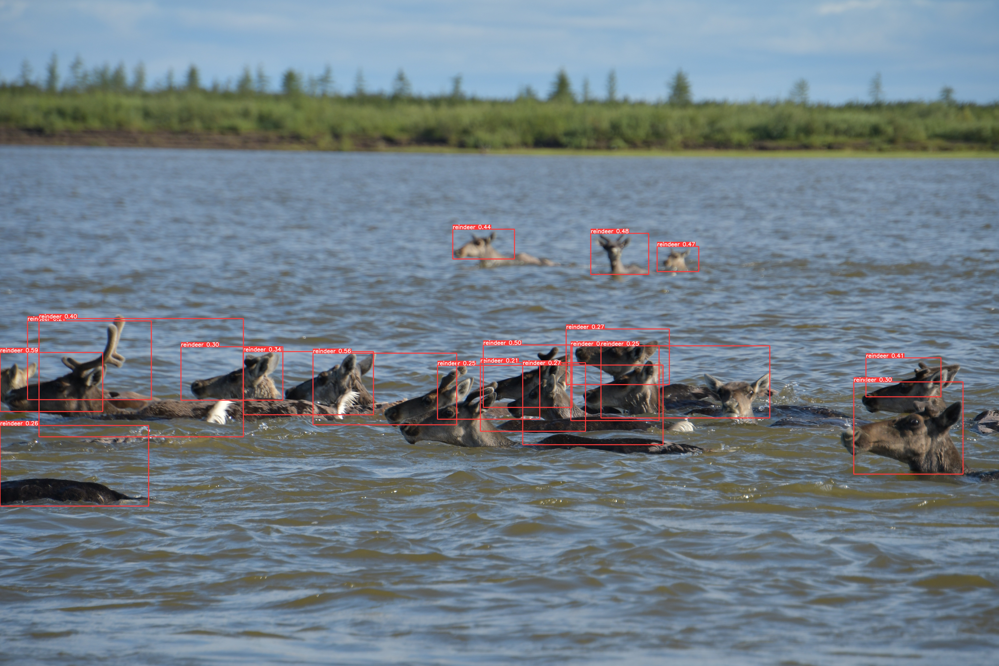

In [38]:
#Image(filename='/content/drive/MyDrive/hackaton_Rosneft_2021_Олени/yolov5s/detect/exp/1ac84f91-6ef6-4195-b5e0-736138448cf9.jpg', width=1280)
Image(filename=os.path.join('runs/detect/exp2','1cb912a1-103a-4464-964e-bc7a2fb0fdd0.jpg'), width=1280)

In [ ]:
#Архивирую модель и результат обучения модели
#!zip -r /content/drive/MyDrive/hackaton_Rosneft_2021_Олени/test_640x600epoch/model_yolo.zip /content/yolov5/runs
#!zip -r /content/drive/MyDrive/hackaton_Rosneft_2021_Олени/test_640x600epoch/results100.zip /content/yolov5/runs/detect/exp2/

In [ ]:
#Загрузка файлов в компьютер
# files.download('/content/drive/MyDrive/hackaton_Rosneft_2021_Олени/1_test/model_yolo.zip')
# files.download("/content/drive/MyDrive/hackaton_Rosneft_2021_Олени/1_test/results.zip")
# files.download('/content/data.yaml')

In [ ]:
#Start tensorboard
#Launch after you have started training
#Logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2122), started 2:59:58 ago. (Use '!kill 2122' to kill it.)

<IPython.core.display.Javascript object>